# Project: Arabic Movies investigation

## Table of Contents
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#cleaning">Data Cleaning</a></li>
<li><a href="#eda">Clustering Data</a></li>
</ul>

In [1]:
# Import statements for all of the packages that we gonna used for the following cells
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

<a id='intro'></a>
# Introduction

#### The dataset selected is the arabic movies dataset.

In [3]:
# Load your data and print out a few lines.
df = pd.read_csv('data.csv')
df.head(5)

,اسم الفيلم,تاريخ العرض,تصنيف الفيلم,مدة الفيلم (دقيقة),ملخص,تأليف,تمثيل,إنتاج,تصوير,مونتاج,ديكور,ملابس,موسيقى,إخراج,توزيع
0,قلب المرأة,6 مايو 1940,ﺭﻭﻣﺎﻧﺴﻲ,87,تدور أحداث الفيلم حول (خيرية)، الفتاة الثرية ا...,توجو مزراحي (أحمد المشرقي),"سليمان نجيب,أمينة رزق,دولت أبيض,عقيلة راتب,سلو...",NaN,عبدالحليم نصر,NaN,NaN,NaN,NaN,توجو مزراحي (أحمد المشرقي),منتخبات بهنا فيلم
1,الورشة,28 نوفمبر 1940,ﺩﺭاﻣﺎ,105,يسافر الأسطى (علي عبدالرحمن) صاحب ورشة الميكان...,"عزيزة أمير,محمود ذو الفقار","عزيزة أمير,محمود ذو الفقار,أنور وجدي,نجمة إبرا...",إيزيس فيلم,"أرام ماراليان,فيرى فاركاش (فرانسوا فاركاش)",NaN,محمد كامل,NaN,عبدالحميد عبدالرحمن,إستيفان روستي,منتخبات بهنا فيلم
2,تحت السلاح,8 فبراير 1940,NaN,101.4,أمينة فتاة من أسرة عريقة، تقرر العائلة زواجها ...,NaN,"أحمد علام,زوزو شكيب,عباس فارس,محمد الديب,زينات...",ألفيزى اورفانيللى,NaN,NaN,NaN,NaN,NaN,فؤاد الجزايرلي,NaN
3,حياة الظلام,1940,ﺩﺭاﻣﺎ,94,عائلة متوسطة الحال مكونة من زوج وزوجة وابنهما ...,"محمود كامل حسن,أحمد بدرخان","ميمي شكيب,محسن سرحان,روحية خالد,فردوس محمد,علي...",محمد جمال الدين رفعت,محمد عبدالعظيم,جمال مدكور,"علي عابد,روبرت شارفنبرج",NaN,"بيرم التونسي,عبدالحميد عبدالرحمن,محمد الكحلاوي...","أحمد بدرخان,فريد الجندي",NaN
4,صرخة في الليل,31 اكتوبر 1940,NaN,110,لا تحفظ الزوجة الساقطة شرف زوجها الثرى فترتبط ...,السيد زيادة,"بدر لاما,رجاء عبده,سميحة سميح,بشارة واكيم,منسى...",كوندور فيلم,إبراهيم شيبا,"بدر لاما,ألبير نجيب",محروس زيادة,NaN,"فريد غصن,يوسف صالح",إبراهيم لاما,منتخبات بهنا فيلم


<a id='cleaning'></a>
## Data Cleaning
<ul>
    <li> <a href='#Remove'>Remove un-needed features</a>
    <li> <a href="#Rename">Rename columns </a>
    <li> <a href="#Null">Remove null</a>
<ul>

In [4]:
# The shape of the database
df.shape

(2372, 15)

In [5]:
##Now it is time to discuss the structure of the data to find if it is cleaned or not by three steps
# 1. rename columns to english in order to easily process them
# 2. remove rows that contain null values
# 3. 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2372 entries, 0 to 2371
Data columns (total 15 columns):
اسم الفيلم            2372 non-null object
تاريخ العرض           2372 non-null object
تصنيف الفيلم          1219 non-null object
مدة الفيلم (دقيقة)    2372 non-null object
ملخص                  2071 non-null object
تأليف                 2098 non-null object
تمثيل                 2270 non-null object
إنتاج                 1824 non-null object
تصوير                 1908 non-null object
مونتاج                1740 non-null object
ديكور                 1470 non-null object
ملابس                 276 non-null object
موسيقى                1398 non-null object
إخراج                 2196 non-null object
توزيع                 1114 non-null object
dtypes: object(15)
memory usage: 278.0+ KB


<a id='Remove'></a>
### Remove un-needed features

**In this section, we just remove un-needed features to fastin processing**

In [6]:
# After discussing the structure of the data and any problems that need to be
#   cleaned, perform those cleaning steps in the second part of this section.
#imdb_id
columns_deleted=['تأليف','ملابس','مدة الفيلم (دقيقة)','مونتاج','تصوير','موسيقى','توزيع','إخراج','ديكور','إنتاج','إنتاج','ملخص']
df.drop(columns_deleted,axis=1,inplace= True)

In [7]:
df.head()

,اسم الفيلم,تاريخ العرض,تصنيف الفيلم,تمثيل
0,قلب المرأة,6 مايو 1940,ﺭﻭﻣﺎﻧﺴﻲ,"سليمان نجيب,أمينة رزق,دولت أبيض,عقيلة راتب,سلو..."
1,الورشة,28 نوفمبر 1940,ﺩﺭاﻣﺎ,"عزيزة أمير,محمود ذو الفقار,أنور وجدي,نجمة إبرا..."
2,تحت السلاح,8 فبراير 1940,NaN,"أحمد علام,زوزو شكيب,عباس فارس,محمد الديب,زينات..."
3,حياة الظلام,1940,ﺩﺭاﻣﺎ,"ميمي شكيب,محسن سرحان,روحية خالد,فردوس محمد,علي..."
4,صرخة في الليل,31 اكتوبر 1940,NaN,"بدر لاما,رجاء عبده,سميحة سميح,بشارة واكيم,منسى..."


<a id='Rename'></a>
### Rename columns

**In this section, we just rename column in english in order to easily process**

In [8]:
df.rename(columns={'اسم الفيلم': 'original_title', 'تاريخ العرض': 'release_date','تصنيف الفيلم': 'genres','تمثيل': 'cast'},
          inplace=True)


In [9]:
df.head()

,original_title,release_date,genres,cast
0,قلب المرأة,6 مايو 1940,ﺭﻭﻣﺎﻧﺴﻲ,"سليمان نجيب,أمينة رزق,دولت أبيض,عقيلة راتب,سلو..."
1,الورشة,28 نوفمبر 1940,ﺩﺭاﻣﺎ,"عزيزة أمير,محمود ذو الفقار,أنور وجدي,نجمة إبرا..."
2,تحت السلاح,8 فبراير 1940,NaN,"أحمد علام,زوزو شكيب,عباس فارس,محمد الديب,زينات..."
3,حياة الظلام,1940,ﺩﺭاﻣﺎ,"ميمي شكيب,محسن سرحان,روحية خالد,فردوس محمد,علي..."
4,صرخة في الليل,31 اكتوبر 1940,NaN,"بدر لاما,رجاء عبده,سميحة سميح,بشارة واكيم,منسى..."


<a id='Null'></a>
### Remove Null and Duplicates

**In this section, we just remove the rows that contain null values along with duplicates**

First detect which column has null values

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2372 entries, 0 to 2371
Data columns (total 4 columns):
original_title    2372 non-null object
release_date      2372 non-null object
genres            1219 non-null object
cast              2270 non-null object
dtypes: object(4)
memory usage: 74.2+ KB


**Explanation**

We can easily detect that there are already columns that contain null values such as
        <ul>
            <li>genres
            <li>cast
        </ul>
Because the data contains 2372 rows while these features have fewer values than expected.

**Cast and Genres both might affect our analysis and we cannot replace these NaN  with any values since they are qualtative values not quantative one that is why we need to remove them** 

> **Number of Null values per column**

In [11]:
#making sure that everthing is going in the right way
df.isnull().sum()

original_title       0
release_date         0
genres            1153
cast               102
dtype: int64

In [12]:
#Dropping rows contained NaN
df.dropna(axis=0,inplace=True)
df.reset_index(drop=True, inplace=True)

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1211 entries, 0 to 1210
Data columns (total 4 columns):
original_title    1211 non-null object
release_date      1211 non-null object
genres            1211 non-null object
cast              1211 non-null object
dtypes: object(4)
memory usage: 37.9+ KB


> **Number of Duplicates**

In [14]:
df.duplicated().sum()

1

In [15]:
#Dropping duplicated values
df.drop_duplicates(inplace=True)

Final data shape

In [16]:
df.shape

(1210, 4)

In [17]:
df.head(10)

,original_title,release_date,genres,cast
0,قلب المرأة,6 مايو 1940,ﺭﻭﻣﺎﻧﺴﻲ,"سليمان نجيب,أمينة رزق,دولت أبيض,عقيلة راتب,سلو..."
1,الورشة,28 نوفمبر 1940,ﺩﺭاﻣﺎ,"عزيزة أمير,محمود ذو الفقار,أنور وجدي,نجمة إبرا..."
2,حياة الظلام,1940,ﺩﺭاﻣﺎ,"ميمي شكيب,محسن سرحان,روحية خالد,فردوس محمد,علي..."
3,الباشمقاول,18 يناير 1940,ﻛﻮﻣﻴﺪﻱ,"فوزي الجزايرلي,ميمي شكيب,إحسان الجزايرلي,زوزو ..."
4,يوم سعيد,15 يناير 1940,ﺭﻭﻣﺎﻧﺴﻲ,"محمد عبدالوهاب,علوية جميل,فاطمة محجوب,فاتن حما..."
5,الفرسان الثلاثة,15 مايو 1941,ﻛﻮﻣﻴﺪﻱ,"فوزي الجزايرلي,عقيلة راتب,إحسان الجزايرلي,فردو..."
6,ليلى بنت مدارس,16 اكتوبر 1941,اﺳﺘﻌﺮاﺿﻲ,"يوسف وهبي,ليلى مراد,ميمي شكيب,محسن سرحان,بشارة..."
7,امرأة خطرة,10 ابريل 1941,ﺩﺭاﻣﺎ,"آسيا داغر,حسين صدقي,عباس فارس,روحية خالد,زينب ..."
8,ألف ليلة وليلة,20 مارس 1941,ﻣﻐﺎﻣﺮاﺕ,"علي الكسار,عقيلة راتب,حامد مرسي,علي عبدالعال,ز..."
9,انتصار الشباب,24 مارس 1941,اﺳﺘﻌﺮاﺿﻲ,"أسمهان,فريد الأطرش,أنور وجدي,بشارة واكيم,عبدال..."


<a id='eda'></a>
## Clustering Data</a></li>

In [19]:
df['genres'].value_counts()

ﺩﺭاﻣﺎ           440
ﺭﻭﻣﺎﻧﺴﻲ         256
ﻛﻮﻣﻴﺪﻱ          242
اﺳﺘﻌﺮاﺿﻲ         83
ﺟﺮﻳﻤﺔ            65
تاريخي           29
ﺣﺮﻛﺔ             26
ﺗﺸﻮﻳﻖ ﻭﺇﺛﺎﺭﺓ     12
ﻣﻐﺎﻣﺮاﺕ          11
ﻏﻤﻮﺽ             10
ﺳﻴﺮﺓ ﺫاﺗﻴﺔ        8
ﺣﺮﺏ               7
ﺧﻴﺎﻝ ﻋﻠﻤﻲ         5
ﻗﺼﻴﺮ              4
ﻋﺎﺋﻠﻲ             3
ﺭﻳﺎﺿﻲ             3
ﺧﻴﺎﻝ              2
ﻭﺛﺎﺋﻘﻲ            2
ﺭﺳﻮﻡ ﻣﺘﺤﺮﻛﺔ       1
ﺭﻋﺐ               1
Name: genres, dtype: int64

**We need to translate genres into English to be able to visulize them.**

In [20]:
df['genres']=df['genres'].replace({'ﺩﺭاﻣﺎ': 'Drama',
                      'ﺭﻭﻣﺎﻧﺴﻲ': 'Romance',
                      'ﻛﻮﻣﻴﺪﻱ': 'Comedy',
                      'اﺳﺘﻌﺮاﺿﻲ':'Musical',
                      'ﺟﺮﻳﻤﺔ':'Crime',
                      'تاريخي':'Historical',
                      'ﺣﺮﻛﺔ':'Action',
                      'ﺗﺸﻮﻳﻖ ﻭﺇﺛﺎﺭﺓ':'Thriller & Excitement',
                      'ﻣﻐﺎﻣﺮاﺕ':'Adventure',
                      'ﻏﻤﻮﺽ':'Mystery',
                      'ﺳﻴﺮﺓ ﺫاﺗﻴﺔ':'Autobiography',
                      'ﺣﺮﺏ':'War',
                      'ﺧﻴﺎﻝ ﻋﻠﻤﻲ':'Science-fiction',
                      'ﻗﺼﻴﺮ':'Short-film',
                      'ﺭﻳﺎﺿﻲ':'Sports',
                      'ﻋﺎﺋﻠﻲ':'Family',
                      'ﻭﺛﺎﺋﻘﻲ':'Documentary',
                      'ﺧﻴﺎﻝ':'Fiction',
                      'ﺭﺳﻮﻡ ﻣﺘﺤﺮﻛﺔ':'Animation',
                      'ﺭﻋﺐ':'Horror'
                     });

In [21]:
df['genres'].value_counts()

Drama                    440
Romance                  256
Comedy                   242
Musical                   83
Crime                     65
Historical                29
Action                    26
Thriller & Excitement     12
Adventure                 11
Mystery                   10
Autobiography              8
War                        7
Science-fiction            5
Short-film                 4
Family                     3
Sports                     3
Documentary                2
Fiction                    2
Horror                     1
Animation                  1
Name: genres, dtype: int64

In [22]:
#Getting the genres column and put it into a new dataframe
genres_col=df[['original_title','genres']]
genres_df = pd.DataFrame(genres_col)
genres_df.head()

,original_title,genres
0,قلب المرأة,Romance
1,الورشة,Drama
2,حياة الظلام,Drama
3,الباشمقاول,Comedy
4,يوم سعيد,Romance


In [23]:
# Spliting the genres from dataframe/
genres_splitted_df  = pd.concat([df['genres'],df['original_title']], axis=1, keys=['genres','original_title'])
genres_splitted_df.head()

,genres,original_title
0,Romance,قلب المرأة
1,Drama,الورشة
2,Drama,حياة الظلام
3,Comedy,الباشمقاول
4,Romance,يوم سعيد


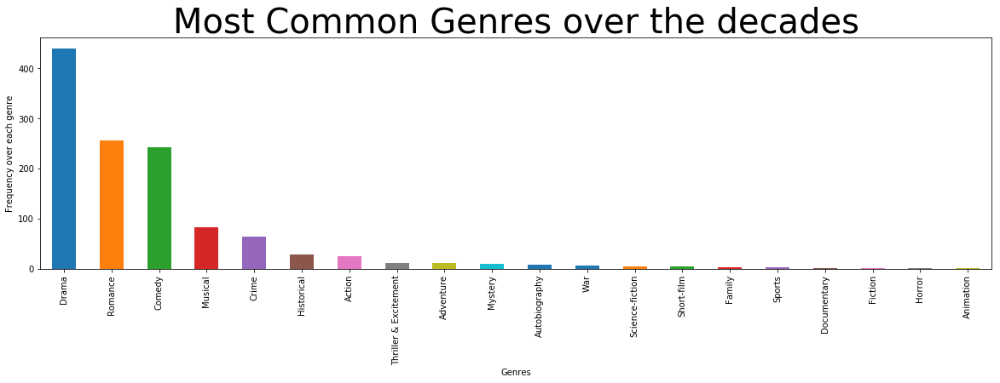

In [24]:
# Create a bar chart to see the distribuation
genres_splitted_df['genres'].value_counts().plot(kind='bar',figsize=(20,5))
plt.title('Most Common Genres over the decades',fontsize=40)
plt.xlabel('Genres',fontsize=10)
plt.ylabel('Frequency over each genre' ,fontsize=10)
plt.show();

In [25]:
f = (df['cast'].value_counts())

In [26]:
# Spliting the cast of each film.
actors = df.cast.str.split(',', expand=True).stack().reset_index(level=1,drop=True)
geners = df['genres']

df_splitted  = pd.concat([actors,geners], axis=1, keys=['actor','genres'])
#df_splitted=df_splitted.reset_index()
#del df_splitted['index']
df_splitted.head(18)

,actor,genres
0,سليمان نجيب,Romance
0,أمينة رزق,Romance
0,دولت أبيض,Romance
0,عقيلة راتب,Romance
0,سلوى علام,Romance
0,زوزو نبيل,Romance
0,نادية أحمد,Romance
0,نينا زاكى,Romance
0,أنور وجدي,Romance
0,حسن فايق,Romance


**These are the top 10 actor participating in fims**

In [27]:
# Get the number of actors
df_splitted['actor'].nunique()

3437

In [28]:
# Top 60 preforming actors
df_splitted['actor'].value_counts().head(10)

عبدالغني النجدي      233
حسين إسماعيل         220
عبدالمنعم إسماعيل    209
محمود المليجي        207
محسن حسنين           173
محمد شوقي            155
فريد شوقي            153
عبدالمنعم بسيوني     137
إسماعيل يس           136
توفيق الدقن          136
Name: actor, dtype: int64

> ### Clustering between Genres and Actors

**We will use TUNGraph because it is undirected graph (single edge between an unordered pair of nodes)**

In [29]:
import snap
# Create an un-directed graph
from graphviz import Graph
G = snap.TUNGraph.New()
S = snap.TIntStrH()

In [72]:
# Create a node for each category in Genres
idx=0
nodes_idx = {}
for genre in set(df_splitted['genres']):
    # Each node has an unique id.
    G.AddNode(idx)
    S.AddDat(idx,genre)
    nodes_idx[genre]=idx
    idx+=1

In [73]:
## Total number of nodes till now.
print(idx)

20


In [74]:
#Create a node for each actor 
## We have 3437 actors so we will have 3437 nodes for actors only

for actor in set(df_splitted['actor']):
    # Each node has an unique id.
    G.AddNode(idx)
    S.AddDat(idx,actor)
    nodes_idx[actor]=idx
    idx+=1

In [75]:
## Total number of nodes till now.
print(idx)

3457


In [76]:
## Adding Edges    
for genre in set(df_splitted['genres']):
    actors_genre = set((df_splitted.loc[df_splitted['genres'] == genre]).actor)
    for actor in actors_genre:
        G.AddEdge(nodes_idx[actor],nodes_idx[genre])
        

In [77]:
snap.DrawGViz(G, snap.gvlDot, "gviz.png", "Graph", S)

In [78]:
from IPython.display import Image
Image(filename = 'gviz.png',width = 1000,height=1000)

In [ ]:
# traverse the nodes
for NI in G.Nodes():
    print "node id %d with out-degree %d and in-degree %d" % (
        NI.GetId(), NI.GetOutDeg(), NI.GetInDeg())
# traverse the edges
for EI in G.Edges():
    print "edge (%d, %d)" % (EI.GetSrcNId(), EI.GetDstNId())
# traverse the edges by nodes
for NI in G.Nodes():
    for Id in NI.GetOutEdges():
        print "edge (%d %d)" % (NI.GetId(), Id)

In [ ]:
snap.SaveEdgeList(G, "Graph_1.txt", "Save as tab-separated list of edges")
#G5 = snap.LoadEdgeList(snap.PNGraph, "test.txt", 0, 1)

> ### Clustering of actors that worked together on different films**

In [30]:
print(df.iloc[0]['cast'])

سليمان نجيب,أمينة رزق,دولت أبيض,عقيلة راتب,سلوى علام,زوزو نبيل,نادية أحمد,نينا زاكى,أنور وجدي,حسن فايق,فاخر فاخر,محمود المليجي,زكي إبراهيم,حسن مختار صقر,عزيزة محمد,مرجريت صفير,مختار عثمان,لطفي الحكيم


In [31]:
# Make a dictionary that contains the name of actor with unique-ID
def mapping(seq):
    actordic = {}
    for i in range(len(seq)):
        actordic[seq[i]]=i
    return actordic

In [32]:
actors_list = list(actors.unique())
actors_dic = mapping(actors_list)

In [33]:
print actors_dic['سليمان نجيب']

0


In [34]:
#actors_dic
rev_dic_actor = {v: k for k, v in actors_dic.iteritems()}

In [35]:
len(actors_list)

3437

In [36]:
print actors_list[0]

سليمان نجيب


In [37]:
# Number of movies
num_movies = df.shape[0]

In [38]:
# Create a 2D array in which len of 1D is the number of films while the other is for the number of actors
actors_films = np.zeros((num_movies, len(actors_list)), dtype=bool)
for film_number in range(num_movies):
    cast = (df.iloc[film_number]['cast']).split(",")
    for actor in cast:
        actor_index = actors_dic[actor]
        actors_films[film_number][actor_index]=True

In [39]:
actors_films[:][3]

array([False, False, False, ..., False, False, False])

In [40]:
for r in np.where(actors_films[0])[0]:
    name = rev_dic_actor[r]

In [41]:
actors_arr = np.zeros((len(actors_list), len(actors_list)), dtype=bool)

In [42]:
actors_arr.shape

(3437, 3437)

In [43]:
ff = {}
for actor in actors_list:
    ff[actor] =set()

In [44]:
for cast in actors_films:
    cast_in = np.where(cast)[0]
    for actor_in in cast_in:
        name=rev_dic_actor[actor_in]
        ff[name]=ff[name].union(set(cast_in))

In [45]:
actors_arr = np.zeros(len(actors_list), dtype=bool)
final_dic = {}

for actor in actors_list:
    final_dic[actor] = np.zeros(len(actors_list), dtype=bool)
    for acting_with in ff[actor]:
        final_dic[actor][acting_with]=True
    
    


In [46]:
nam= 'سليمان نجيب'
print (np.where(final_dic[nam]==True))[0]

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  21  22  26  28  29  31  33  36  38  39  45  49  51  54  55  58
  62  63  67  73  75  77  78  83  84  85  87  90  92  94  96  98 101 102
 104 105 106 108 112 113 114 115 116 117 118 120 124 125 128 131 133 135
 136 137 141 143 144 156 157 159 160 161 162 163 164 165 168 169 175 183
 185 186 187 192 193 196 197 203 207 209 211 215 217 220 223 227 229 233
 236 237 246 249 252 255 262 268 272 273 275 278 280 282 301 302 303 304
 305 306 307 308 311 314 317 326 335 336 337 338 339 343 344 345 346 348
 357 359 364 365 366 367 368 369 370 371 375 377 385 387 389 392 398 400
 403 404 405 406 408 410 411 412 413 415 416 418 421 426 431 434 439 452
 459 464 475 476 478 479 482 483 484 485 486 487 489 495 497 498 499 500
 501 502 508 510 511 513 514 515 519 521 526 532 534 537 540 544 552 564
 567 573 574 581 584 585 588 596 606 615 616 621 624 627 629 636 637 638
 639 668 686 708 711 712 713 720 724 733 734 735 74

In [47]:
actors_df = pd.DataFrame(final_dic)
actors_df.index = (actors_list)
actors_df.shape

(3437, 3437)

In [48]:
actors_df.head()

,رمزية حميد,سعيد حسن,فاروق إبراهيم,فوزية حسن,نيللى,احمد التهامي,عبدالله زكي,كارين بلاك,كمال عبدالعزيز,مصطفى كامل,...,يوسف صالح,يوسف عثمان,يوسف عوف,يوسف فخر الدين,يوسف فخري,يوسف منصور,يوسف وهبي,يولاند أسمر,يونس شلبي,‫ابراهيم ديليدينز‬
سليمان نجيب,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
أمينة رزق,False,False,False,False,False,False,False,False,False,False,...,False,False,False,True,False,False,True,False,False,False
دولت أبيض,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
عقيلة راتب,False,False,False,False,False,False,False,False,True,False,...,False,False,False,True,False,False,True,False,True,False
سلوى علام,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False


In [49]:
## For testing that values are true
#temp_df = pd.DataFrame(actors_df['سليمان نجيب'])
#temp_df[temp_df['سليمان نجيب']]

In [50]:
#i = 0 
#for actor in actors_list:
 #   actor_index = actors_dic[actor]
  #  for film_number in range(num_movies):
   #     cast = (df.iloc[film_number]['cast'])
    #    if(actor in cast):
     #       #print(len(actors_df[actor])==len(list(actors_films[film_number])))
      #  
       #     actors_arr[actor_index]=actors_films[film_number]

In [51]:
#actors_df.head()

In [53]:
#print(actors_dic['عبدالمنعم إسماعيل'])
#print('عبدالمنعم إسماعيل' in df.iloc[0]['cast'])
#print(actors_films[0][actors_dic['عبدالمنعم إسماعيل']])

In [54]:
# Create an un-directed graph
from graphviz import Graph
G2 = snap.TUNGraph.New()
S2 = snap.TIntStrH()

**Create a node for each actor**

In [55]:
# Create a node for each category in Genres
for actor in actors_list:
    # Each node has an unique id which is the same id that we have set for each actor previously.
    actor_idx  = actors_dic[actor]
    G2.AddNode(actor_idx)
    S2.AddDat(actor_idx,actor)

**Create Edges**

In [69]:
edges = []
i = 0 
for actor in actors_list:
    i+=1
    actor_1 = actors_dic[actor]
    for actor_2 in ff[actor]:
        edge = actor_1,actor_2
      #  if(not(edge in edges or edge_other_way in edges or actor_1 == actor_2)):
        if(not(actor_1 == actor_2)):
            G2.AddEdge(actor_1,actor_2)
            edges.append(edge)


In [71]:
#edges